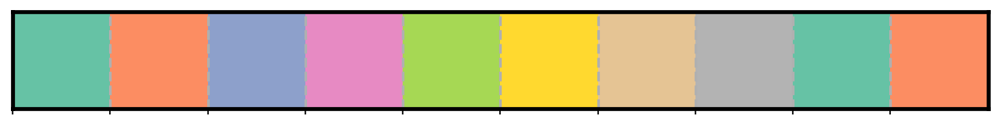

In [3]:
import sys
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import xarray as xr
import seaborn as sns
from scipy import stats
import cmocean
import pandas as pd
import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
def setup_plotting(ticksize=14, fontsize=20, figsize=(16, 9), dpi=150):
    """
    Global plotting setup with grey background and custom styling
    """

    # --- Figure defaults ---
    plt.rcParams.update({
        "figure.figsize": figsize,
        "figure.dpi": dpi,
    })

    # --- Background color ---
    plt.rcParams['axes.facecolor'] = "#e8e8e8"

    # --- Fonts ---
    rc = {"font.family": "serif", 
          "mathtext.fontset": "stix",
          "font.serif": ["DejaVu Serif"]}  # Better subscript support
    plt.rcParams.update(rc)
    
    plt.rcParams.update({
        "font.size": fontsize,
        "xtick.labelsize": ticksize,
        "ytick.labelsize": ticksize,
    })

    # --- Axes & ticks ---
    plt.rcParams.update({
        "axes.linewidth": 2.25,
        "axes.formatter.limits": (-1, 3),
        "axes.grid": True,
        "legend.facecolor": "white",
    })

    # --- Grid ---
    plt.rcParams.update({
        "grid.linestyle": "--",
        "grid.linewidth": 1.5,
    })

    # --- Color palette ---
    colors = sns.color_palette("Set2", 10)
    sns.set_palette(colors)
    sns.palplot(colors)
    plt.show()

    return colors




def stylize_ticks(fig, ax):
    """
    Apply inward ticks, minor ticks, and label offsets
    """

    ax.xaxis.set_tick_params(which="major", direction="in",
                             width=2.5, length=12, top=True)
    ax.yaxis.set_tick_params(which="major", direction="in",
                             width=2.5, length=12, right=True)

    ax.xaxis.set_tick_params(which="minor", direction="in",
                             width=1.5, length=6, top=True)
    ax.yaxis.set_tick_params(which="minor", direction="in",
                             width=1.5, length=6, right=True)

    # Label offsets
    dx = -3 / 72
    dy = -3 / 72
    x_offset = matplotlib.transforms.ScaledTranslation(dx, 0, fig.dpi_scale_trans)
    y_offset = matplotlib.transforms.ScaledTranslation(0, dy, fig.dpi_scale_trans)

    for label in ax.xaxis.get_majorticklabels():
        label.set_transform(label.get_transform() + y_offset)

    for label in ax.yaxis.get_majorticklabels():
        label.set_transform(label.get_transform() + x_offset)
colors = setup_plotting(ticksize=14, fontsize=20, figsize=(16, 9), dpi=150)

In [4]:


path = "/Users/asgerthormann/Documents/uni/master/master_code/master_thesis/data/data_stream-oper_stepType-instant.nc"

ds = xr.open_dataset(path)
ds

<xarray.Dataset> Size: 1GB
Dimensions:     (valid_time: 244, latitude: 281, longitude: 601)
Coordinates:
  * valid_time  (valid_time) datetime64[ns] 2kB 1999-11-01 ... 1999-12-31T18:...
    expver      (valid_time) <U4 4kB ...
  * latitude    (latitude) float64 2kB 90.0 89.75 89.5 89.25 ... 20.5 20.25 20.0
  * longitude   (longitude) float64 5kB -90.0 -89.75 -89.5 ... 59.5 59.75 60.0
    number      int64 8B ...
Data variables:
    u10         (valid_time, latitude, longitude) float32 165MB ...
    v10         (valid_time, latitude, longitude) float32 165MB ...
    d2m         (valid_time, latitude, longitude) float32 165MB ...
    t2m         (valid_time, latitude, longitude) float32 165MB ...
    msl         (valid_time, latitude, longitude) float32 165MB ...
    sst         (valid_time, latitude, longitude) float32 165MB ...
    sp          (valid_time, latitude, longitude) float32 165MB ...
    i10fg       (valid_time, latitude, longitude) float32 165MB ...
Attributes:
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    history:                 2026-09-02T14:48 GRIB to CDM+CF via cfgrib-0.9.1...

In [5]:
print(ds)
print(ds.dims)
print(ds.coords)
print(list(ds.data_vars))

<xarray.Dataset> Size: 1GB
Dimensions:     (valid_time: 244, latitude: 281, longitude: 601)
Coordinates:
  * valid_time  (valid_time) datetime64[ns] 2kB 1999-11-01 ... 1999-12-31T18:...
    expver      (valid_time) <U4 4kB ...
  * latitude    (latitude) float64 2kB 90.0 89.75 89.5 89.25 ... 20.5 20.25 20.0
  * longitude   (longitude) float64 5kB -90.0 -89.75 -89.5 ... 59.5 59.75 60.0
    number      int64 8B ...
Data variables:
    u10         (valid_time, latitude, longitude) float32 165MB ...
    v10         (valid_time, latitude, longitude) float32 165MB ...
    d2m         (valid_time, latitude, longitude) float32 165MB ...
    t2m         (valid_time, latitude, longitude) float32 165MB ...
    msl         (valid_time, latitude, longitude) float32 165MB ...
    sst         (valid_time, latitude, longitude) float32 165MB ...
    sp          (valid_time, latitude, longitude) float32 165MB ...
    i10fg       (valid_time, latitude, longitude) float32 165MB ...
Attributes:
    GRIB_cen

In [6]:
temperature = ds["t2m"]

# Metadata and shape
print(temperature)
#print(temperature.dims)
#print(temperature.attrs)

<xarray.DataArray 't2m' (valid_time: 244, latitude: 281, longitude: 601)> Size: 165MB
[41206964 values with dtype=float32]
Coordinates:
  * valid_time  (valid_time) datetime64[ns] 2kB 1999-11-01 ... 1999-12-31T18:...
    expver      (valid_time) <U4 4kB ...
  * latitude    (latitude) float64 2kB 90.0 89.75 89.5 89.25 ... 20.5 20.25 20.0
  * longitude   (longitude) float64 5kB -90.0 -89.75 -89.5 ... 59.5 59.75 60.0
    number      int64 8B ...
Attributes: (12/32)
    GRIB_paramId:                             167
    GRIB_dataType:                            an
    GRIB_numberOfPoints:                      168881
    GRIB_typeOfLevel:                         surface
    GRIB_stepUnits:                           1
    GRIB_stepType:                            instant
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_units:                               K
    long_name:                                2 metre temperature
    units:   

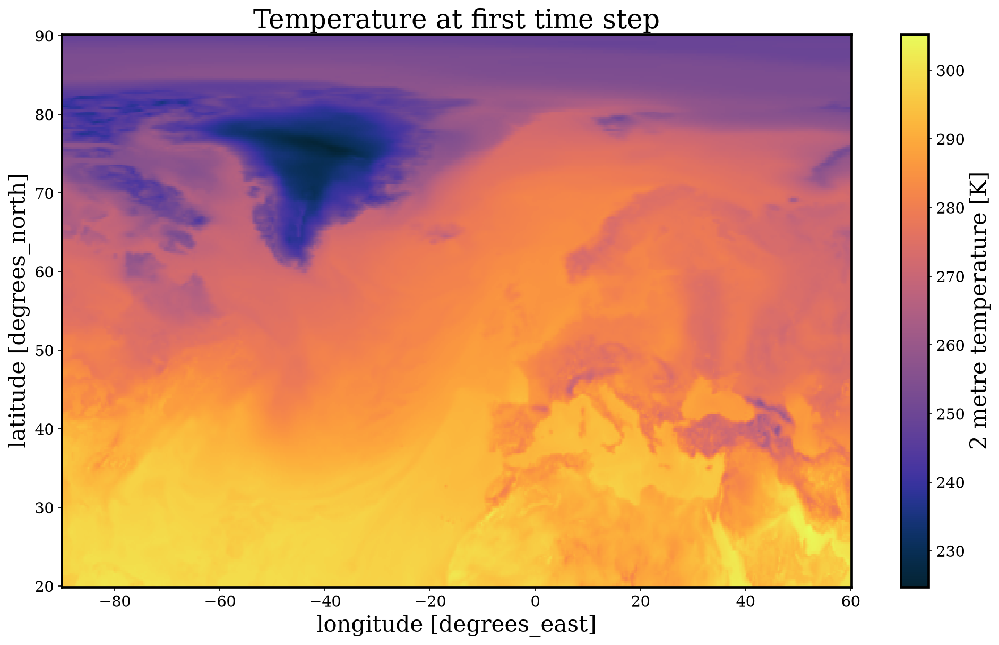

In [7]:
temperature.isel(valid_time=0).plot( cmap=cmocean.cm.thermal)
plt.title("Temperature at first time step")
plt.show()

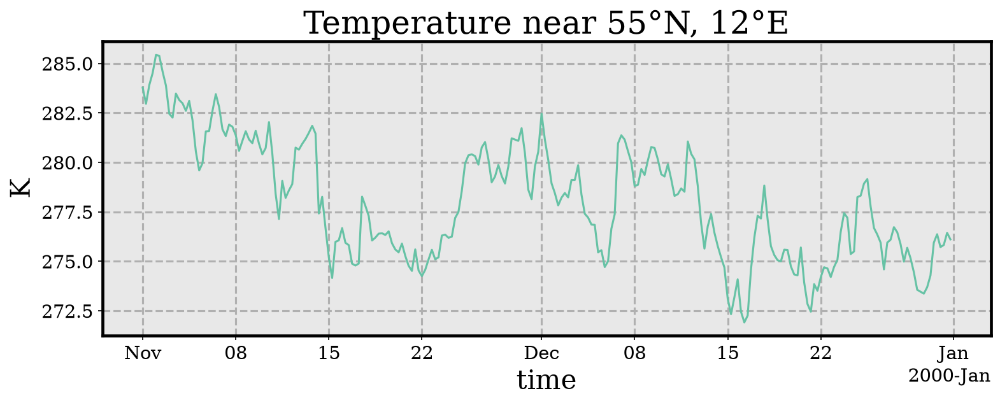

In [8]:
point = temperature.sel(
    latitude=55,
    longitude=12,
    method="nearest",
)

point.plot(figsize=(12, 4))
plt.title("Temperature near 55°N, 12°E")
plt.ylabel(temperature.attrs.get("units", ""))
plt.show()

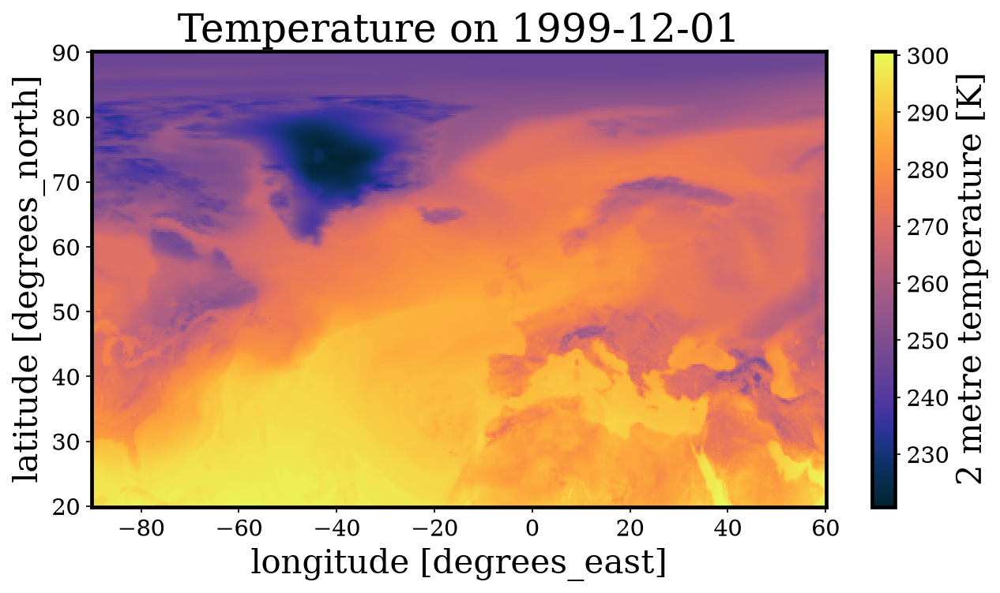

In [9]:
temperature.sel(valid_time="1999-12-01", method="nearest").plot(
    figsize=(10, 5),
    cmap=cmocean.cm.thermal,
)

plt.title("Temperature on 1999-12-01")
plt.show()

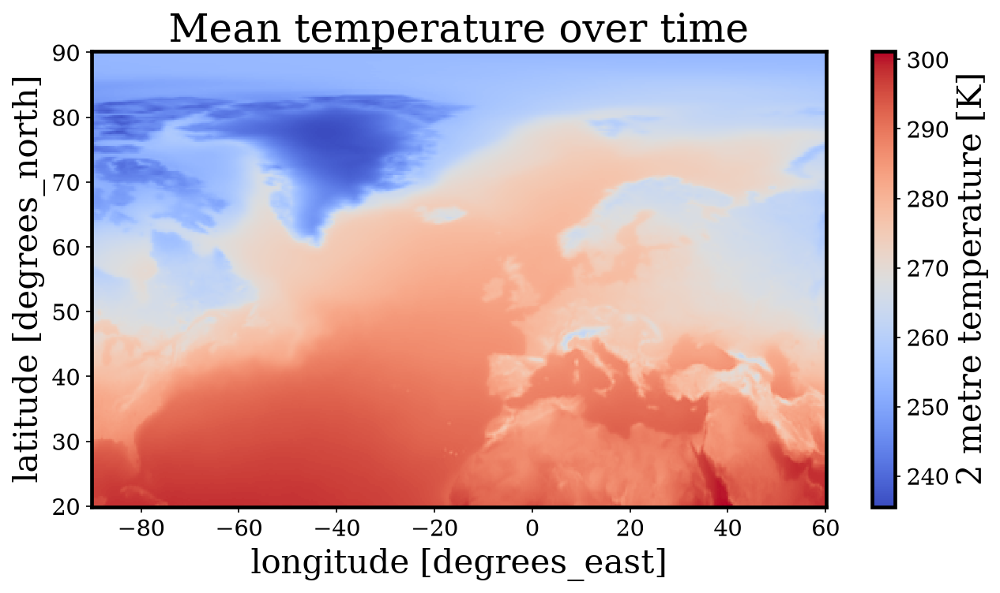

In [10]:
mean_temperature = temperature.mean(dim="valid_time")

mean_temperature.plot(
    figsize=(10, 5),
    cmap="coolwarm",
)

plt.title("Mean temperature over time")
plt.show()

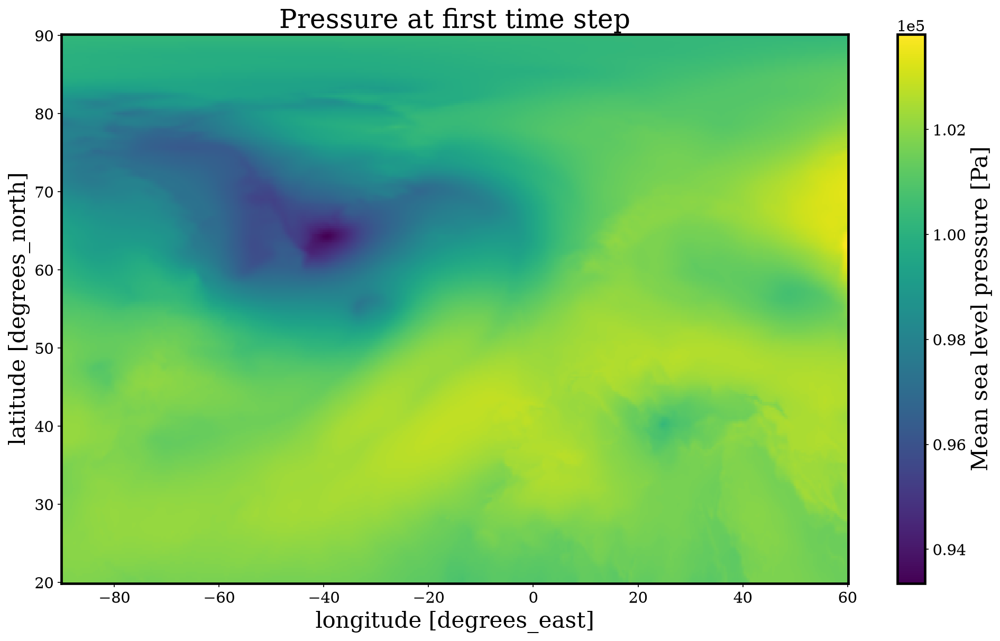

In [11]:
pressure = ds["msl"]
pressure.isel(valid_time=-1).plot()
plt.title("Pressure at first time step")
plt.show()

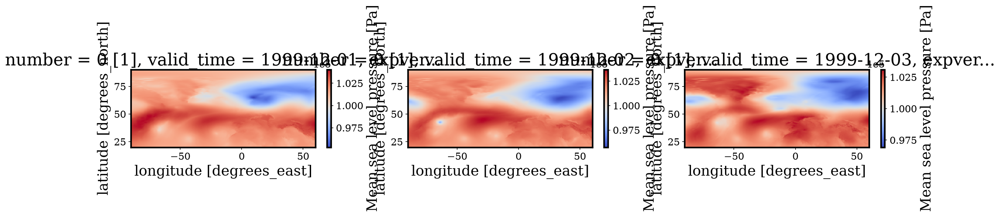

In [12]:
fig, ax = plt.subplots(1, 3,figsize=(20, 2))

pressure.sel(valid_time="1999-12-01", method="nearest").plot(
    cmap="coolwarm",
    ax=ax[0]
)
pressure.sel(valid_time="1999-12-02", method="nearest").plot(
    cmap="coolwarm",
    ax=ax[1]
)
pressure.sel(valid_time="1999-12-03", method="nearest").plot(
    cmap="coolwarm",
    ax=ax[2]
)

plt.show()

/Users/asgerthormann/mamba/envs/master_env/lib/python3.12/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


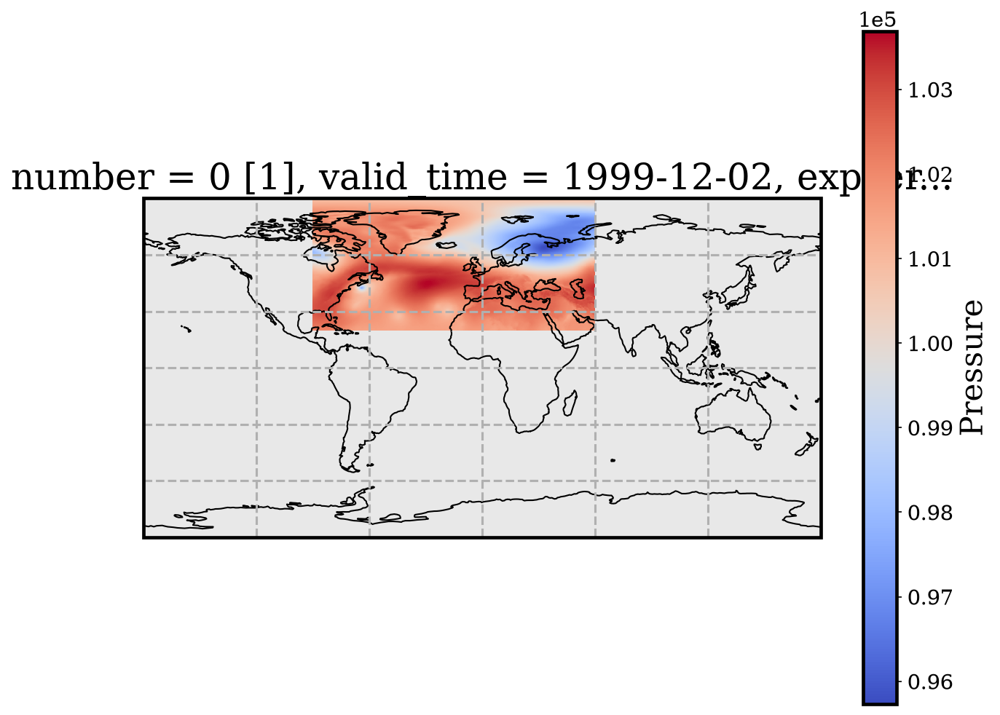

In [13]:

field = pressure.sel(valid_time="1999-12-02", method="nearest")

fig = plt.figure(figsize=(10, 8))
ax = plt.axes(projection=ccrs.PlateCarree())

field.plot(
    ax=ax,
    transform=ccrs.PlateCarree(),
    cmap="coolwarm",
    cbar_kwargs={"label": "Pressure"},
)

ax.coastlines()
ax.gridlines(draw_labels=False)
ax.set_global()

plt.show()

/Users/asgerthormann/mamba/envs/master_env/lib/python3.12/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/asgerthormann/mamba/envs/master_env/lib/python3.12/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


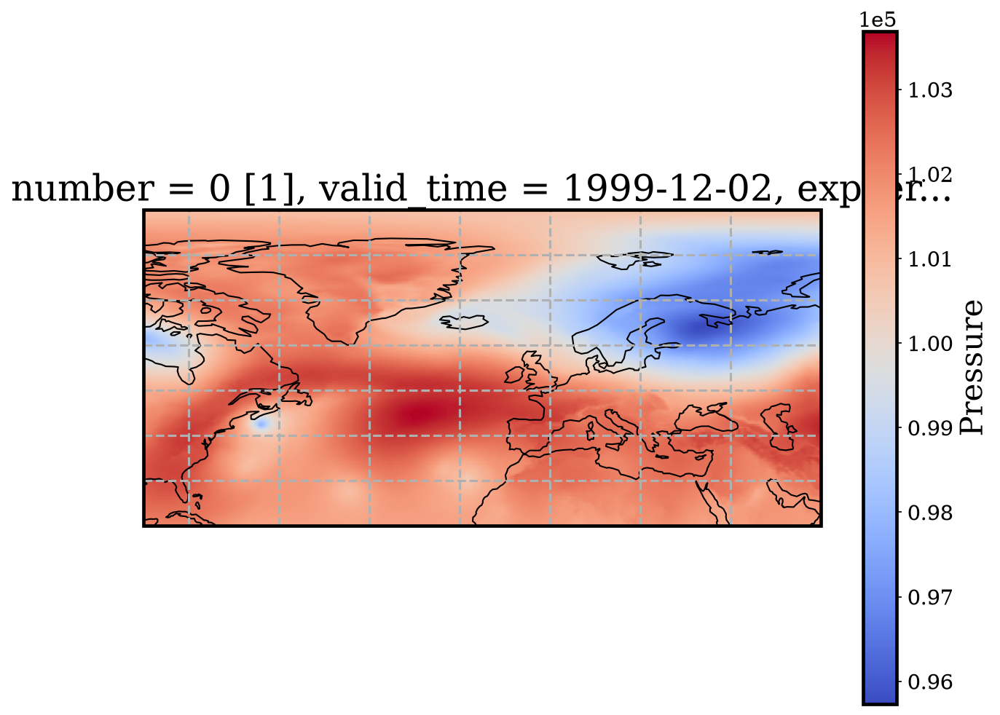

In [14]:

field = pressure.sel(valid_time="1999-12-02", method="nearest")

longitude = ds["longitude"]
latitude = ds["latitude"]

fig = plt.figure(figsize=(10, 8))
ax = plt.axes(
    projection=ccrs.PlateCarree()
)

field.plot(
    ax=ax,
    transform=ccrs.PlateCarree(),
    cmap="coolwarm",
    cbar_kwargs={"label": "Pressure"},
)

ax.set_extent(
    [
        float(longitude.min()),
        float(longitude.max()),
        float(latitude.min()),
        float(latitude.max()),
    ],
    crs=ccrs.PlateCarree(),
)

ax.coastlines()
ax.gridlines(draw_labels=False)

plt.show()

## Pressure

/Users/asgerthormann/mamba/envs/master_env/lib/python3.12/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/asgerthormann/mamba/envs/master_env/lib/python3.12/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/asgerthormann/mamba/envs/master_env/lib/python3.12/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/asgerthormann/mamba/envs/master_env/lib/python3.12/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/asgerthormann/mamba/envs/master_env/lib/python3.1

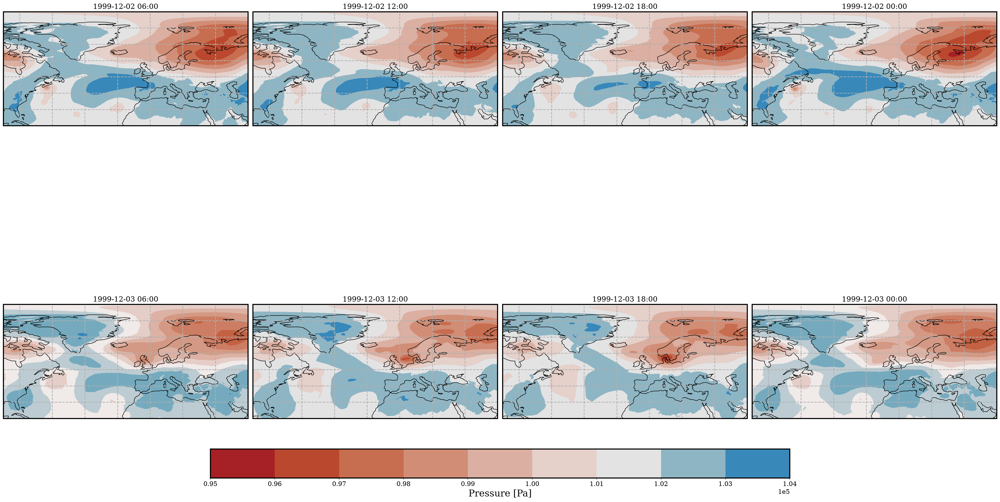

In [19]:

longitude = ds["longitude"]
latitude = ds["latitude"]
hour = ["06", "12", "18", "00"]
day = ["1999-12-02", "1999-12-03"]


vmin = float(pressure.min())
vmax = float(pressure.max())
midpoint = 101325  # Pa; standard sea-level pressure

norm = TwoSlopeNorm(
    vmin=vmin,
    vcenter=midpoint,
    vmax=vmax,
)

fig, ax = plt.subplots(
    2,
    4,
    figsize=(30, 20),
    sharex=True,
    sharey=True,
    
    subplot_kw={
        "projection": ccrs.PlateCarree()
    },
    constrained_layout=True
)

for i, d in enumerate(day):
    for j,h in enumerate(hour):
        current_time = f"{d}T{h}"
        field = pressure.sel(valid_time=current_time, method="nearest")
        field.plot.contourf(
            ax=ax[i, j],
            transform=ccrs.PlateCarree(),
            cmap=cmocean.cm.balance.reversed(),
            norm=norm,
            add_colorbar=False,
            
            #cbar_kwargs={"label": "Pressure"},
            
        )
        ax[i, j].coastlines()
        ax[i, j].gridlines(draw_labels=False)
        ax[i, j].set_title(f"{d} {h}:00", fontsize=16)
        ax[i, j].set_extent(
            [
        float(longitude.min()),
        float(longitude.max()),
        float(latitude.min()),
        float(latitude.max()),
             ],
    crs=ccrs.PlateCarree(),
)

fig.colorbar(ax[0, 0].collections[0], ax=ax, orientation="horizontal", fraction=0.05, pad=0.05, label="Pressure [Pa]")


        


## Temperature

/Users/asgerthormann/mamba/envs/master_env/lib/python3.12/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/asgerthormann/mamba/envs/master_env/lib/python3.12/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/asgerthormann/mamba/envs/master_env/lib/python3.12/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/asgerthormann/mamba/envs/master_env/lib/python3.12/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/asgerthormann/mamba/envs/master_env/lib/python3.1

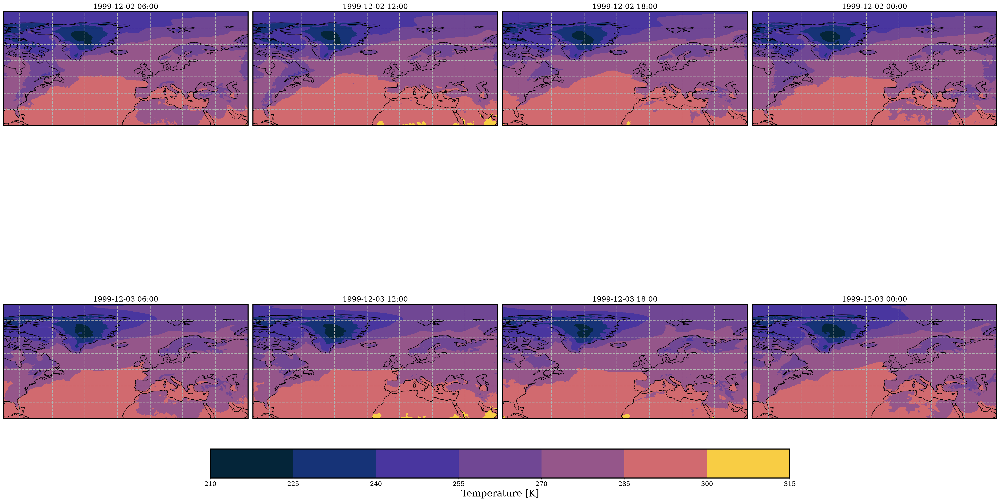

In [16]:
vmin = float(temperature.min())
vmax = float(temperature.max())
midpoint = 288.15  # K; standard sea-level temperature

norm = TwoSlopeNorm(
    vmin=vmin,
    vcenter=midpoint,
    vmax=vmax,
)

fig, ax = plt.subplots(
    2,
    4,
    figsize=(30, 20),
    sharex=True,
    sharey=True,
    
    subplot_kw={
        "projection": ccrs.PlateCarree()
    },
    constrained_layout=True
)

for i, d in enumerate(day):
    for j,h in enumerate(hour):
        current_time = f"{d}T{h}"
        field = temperature.sel(valid_time=current_time, method="nearest")
        field.plot.contourf(
            ax=ax[i, j],
            transform=ccrs.PlateCarree(),
            cmap=cmocean.cm.thermal,
            norm=norm,
            add_colorbar=False,
            
            #cbar_kwargs={"label": "Temperature"},
            
        )
        ax[i, j].coastlines()
        ax[i, j].gridlines(draw_labels=False)
        ax[i, j].set_title(f"{d} {h}:00", fontsize=16)
        ax[i, j].set_extent(
            [
        float(longitude.min()),
        float(longitude.max()),
        float(latitude.min()),
        float(latitude.max()),
             ],
    crs=ccrs.PlateCarree(),
)

fig.colorbar(ax[0, 0].collections[0], ax=ax, orientation="horizontal", fraction=0.05, pad=0.05, label="Temperature [K]")

/Users/asgerthormann/mamba/envs/master_env/lib/python3.12/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/asgerthormann/mamba/envs/master_env/lib/python3.12/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/asgerthormann/mamba/envs/master_env/lib/python3.12/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)


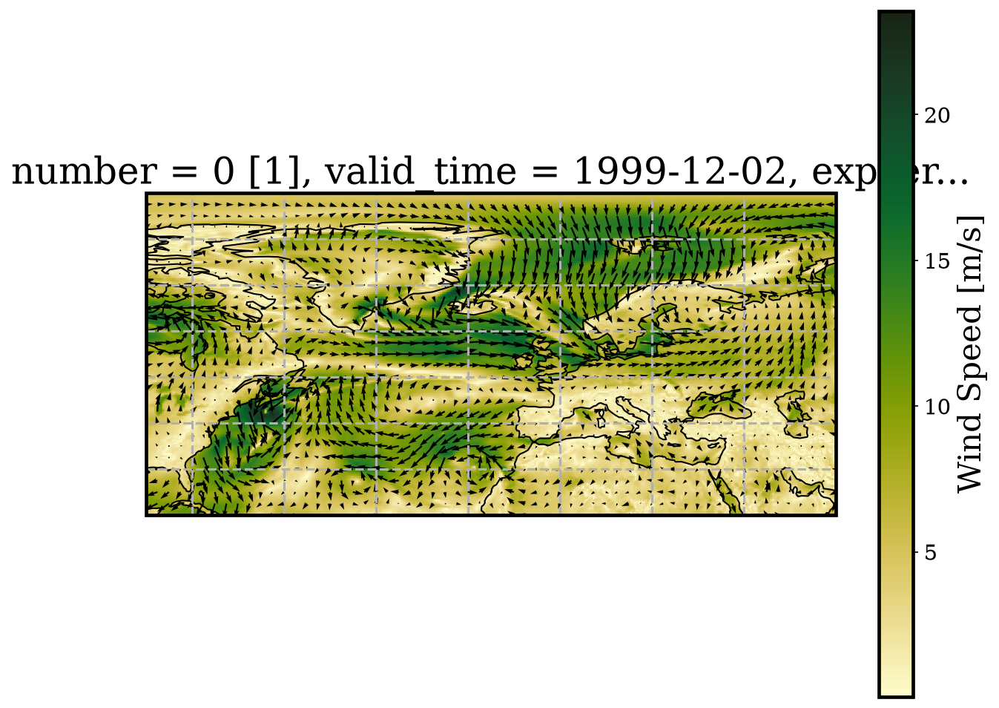

In [17]:
u_wind = ds['u10'].sel(valid_time="1999-12-02", method="nearest")
v_wind = ds['v10'].sel(valid_time="1999-12-02", method="nearest")


fig = plt.figure(figsize=(10, 8))
ax = plt.axes(
    projection=ccrs.PlateCarree()
)

wind_speed = np.sqrt(u_wind**2 + v_wind**2)
wind_speed.plot(
    ax=ax,
    transform=ccrs.PlateCarree(),
    cmap=cmocean.cm.speed,
    cbar_kwargs={"label": "Wind Speed [m/s]"},
)

# Plot every nth vector to avoid a crowded figure
step = 10

wind_vec = ax.quiver(
    longitude.values[::step],
    latitude.values[::step],
    u_wind.values[::step, ::step],
    v_wind.values[::step, ::step],
    transform=ccrs.PlateCarree(),
    scale=500,
    color="black",
)

ax.coastlines()
ax.gridlines(draw_labels=False)
ax.set_extent(
    [
        float(longitude.min()),
        float(longitude.max()),
        float(latitude.min()),
        float(latitude.max()),
    ],
    crs=ccrs.PlateCarree(),
)



/Users/asgerthormann/mamba/envs/master_env/lib/python3.12/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/asgerthormann/mamba/envs/master_env/lib/python3.12/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/asgerthormann/mamba/envs/master_env/lib/python3.12/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/asgerthormann/mamba/envs/master_env/lib/python3.12/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/asgerthormann/mamba/envs/master_env/lib/python3.1

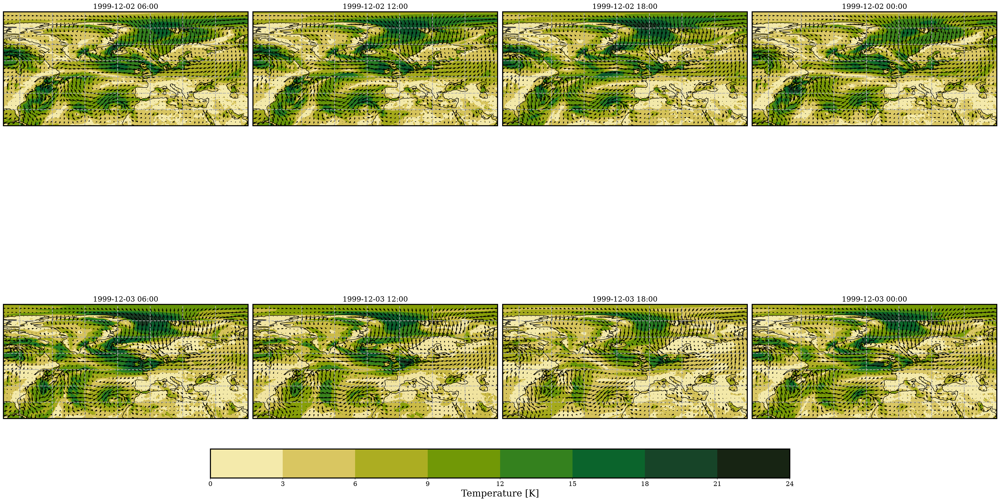

In [18]:
vmin = float(wind_speed.min())
vmax = float(wind_speed.max())


fig, ax = plt.subplots(
    2,
    4,
    figsize=(30, 20),
    sharex=True,
    sharey=True,
    
    subplot_kw={
        "projection": ccrs.PlateCarree()
    },
    constrained_layout=True
)

for i, d in enumerate(day):
    for j,h in enumerate(hour):
        current_time = f"{d}T{h}"
        u_field = ds['u10'].sel(valid_time=current_time, method="nearest")
        v_field = ds['v10'].sel(valid_time=current_time, method="nearest")
        field = np.sqrt(u_field**2 + v_field**2)
        vmin = float(field.min())
        vmax = float(field.max())

        field.plot.contourf(
            ax=ax[i, j],
            transform=ccrs.PlateCarree(),
            cmap=cmocean.cm.speed,
            #norm=norm,
            vmin=vmin,
            vmax=vmax,
            add_colorbar=False,
            #cbar_kwargs={"label": "Wind Speed [m/s]"},
            
        )
        step = 10

        ax[i, j].quiver(
            longitude.values[::step],
            latitude.values[::step],
            u_wind.values[::step, ::step],
            v_wind.values[::step, ::step],
            transform=ccrs.PlateCarree(),
            scale=500,
            color="black",
        )

        ax[i, j].coastlines()
        ax[i, j].gridlines(draw_labels=False)
        ax[i, j].set_title(f"{d} {h}:00", fontsize=16)
        ax[i, j].set_extent(
            [
        float(longitude.min()),
        float(longitude.max()),
        float(latitude.min()),
        float(latitude.max()),
             ],
    crs=ccrs.PlateCarree(),
)

fig.colorbar(ax[0, 0].collections[0], ax=ax, orientation="horizontal", fraction=0.05, pad=0.05, label="Temperature [K]")